<a href="https://colab.research.google.com/github/al-alamin/FaceMaskDetection/blob/main/Jupyter_notebook.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## Initial codes

In [ ]:
print(20/0)

In [ ]:
# %load_ext autotime
import os, sys
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '1'
import zipfile
import tensorflow as tf
from tensorflow.keras.optimizers import RMSprop
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.preprocessing.image import img_to_array
from tensorflow.keras.preprocessing.image import load_img
from tensorflow.keras import layers
from tensorflow.keras import Model
import matplotlib.pyplot as plt
import numpy as np
import tensorflow_datasets as tfds
import pathlib
import pandas as pd
import pickle
import csv
import random
import time
import math
from datetime import datetime
from datetime import timedelta
random.seed(10)

import matplotlib.image as mpimg
import shutil

from importlib import reload


sys.path.append(r'C:\Alamin\Dropbox\Codes')
sys.path.append(r'/home/mdabdullahal.alamin/alamin/Utility/')
import utils

In [ ]:
from importlib import reload
reload(utils)

<module 'utils' from '/home/mdabdullahal.alamin/alamin/Utility/utils.py'>

time: 20.3 ms


## Helper methods

In [ ]:
reload(utils)

<module 'utils' from '/home/mdabdullahal.alamin/alamin/Utility/utils.py'>

time: 32 ms


## Image experiments


### Load dataset

In [ ]:
base_dir =  "/content/drive/MyDrive/UofC/classes/619_ML/cats_and_dogs/"


In [ ]:
ImgX = 256
ImgY = 256

In [ ]:

train_dir = os.path.join(base_dir, 'train')
validation_dir = os.path.join(base_dir, 'validation')
test_dir = os.path.join(base_dir, 'test')

# Directory with our training cat pictures
train_cats_dir = os.path.join(train_dir, 'cats')
# Directory with our training dog pictures
train_dogs_dir = os.path.join(train_dir, 'dogs')

# Directory with our validation cat pictures
validation_cats_dir = os.path.join(validation_dir, 'cats')
# Directory with our validation dog pictures
validation_dogs_dir = os.path.join(validation_dir, 'dogs')

test_cats_dir = os.path.join(test_dir, 'cats')
test_dogs_dir = os.path.join(test_dir, 'dogs')

(382, 499, 3)
(270, 286, 3)
(374, 500, 3)
(374, 500, 3)
(331, 464, 3)
(374, 500, 3)
(374, 500, 3)
(417, 499, 3)
(101, 135, 3)
(374, 499, 3)
(500, 297, 3)
(375, 499, 3)
(284, 400, 3)
(374, 500, 3)
(332, 500, 3)
(400, 302, 3)


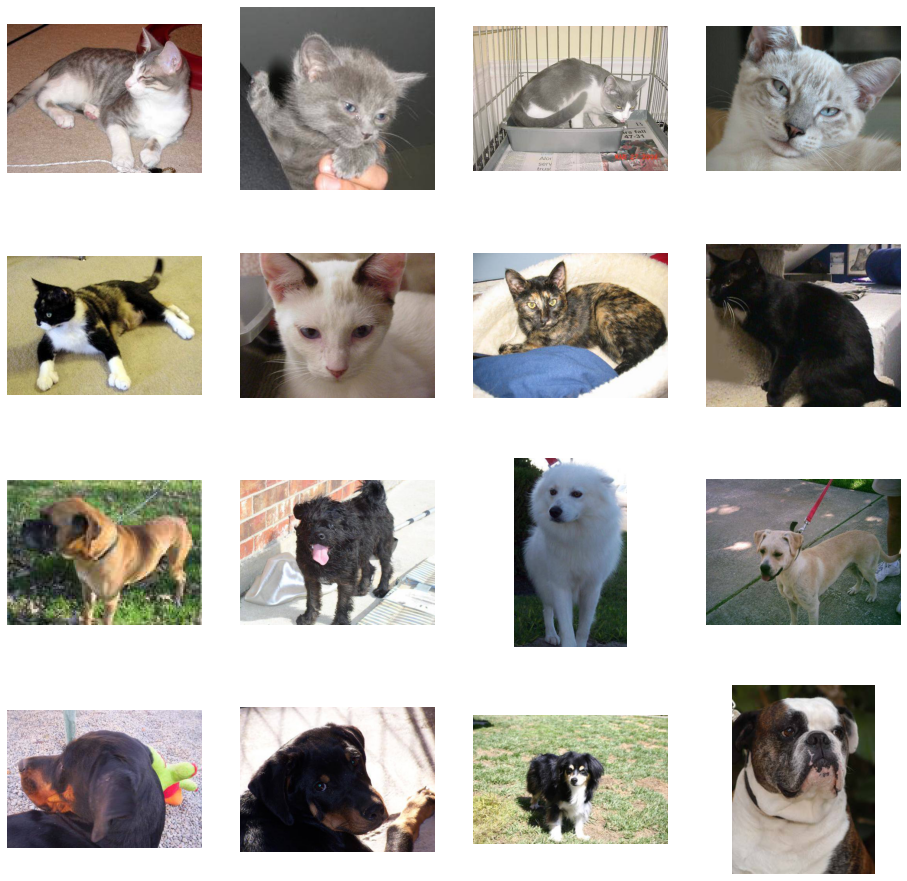

In [ ]:

# Set up matplotlib fig, and size it to fit 4x4 pics
import matplotlib.image as mpimg
nrows = 4
ncols = 4

fig = plt.gcf()
fig.set_size_inches(ncols*4, nrows*4)
pic_index = 100
train_cat_fnames = os.listdir( train_cats_dir )
train_dog_fnames = os.listdir( train_dogs_dir )


next_cat_pix = [os.path.join(train_cats_dir, fname) 
                for fname in train_cat_fnames[ pic_index-8:pic_index] 
               ]

next_dog_pix = [os.path.join(train_dogs_dir, fname) 
                for fname in train_dog_fnames[ pic_index-8:pic_index]
               ]

for i, img_path in enumerate(next_cat_pix+next_dog_pix):
  # Set up subplot; subplot indices start at 1
  sp = plt.subplot(nrows, ncols, i + 1)
  sp.axis('Off') # Don't show axes (or gridlines)

  img = mpimg.imread(img_path)
  print(img.shape)
  plt.imshow(img)

plt.show()

Learning matplotlib

In [ ]:
x1 = np.linspace(0.0, 5.0)
x2 = np.linspace(0.0, 2.0)

y1 = np.cos(2 * np.pi * x1) * np.exp(-x1)
y2 = np.cos(2 * np.pi * x2)

fig, (ax1, ax2) = plt.subplots(2, 1)
print(type(fig))
# fig.suptitle('A tale of 2 subplots')

ax1.plot(x1, y1, 'o-')
ax1.set_ylabel('Damped oscillation')
ax1.set_title("alamin")
# ax1.set_ylim(.2)
# ax1.grid()
# ax1.set_ymargin(4)

# ax3.set_visible(False)

ax2.plot(x2, y2, '.-')
ax2.set_xlabel('time (s)')
ax2.set_ylabel('Undamped')
ax2.set_title("Lia")

fig.set_tight_layout(2.0)
fig.set_size_inches(10, 10)
plt.show()

In [ ]:
train_cat_fnames = os.listdir( train_cats_dir )
train_dog_fnames = os.listdir( train_dogs_dir )


next_cat_pix = [os.path.join(train_cats_dir, fname) 
                for fname in train_cat_fnames[ pic_index-8:pic_index] 
               ]

next_dog_pix = [os.path.join(train_dogs_dir, fname) 
                for fname in train_dog_fnames[ pic_index-8:pic_index]
               ]


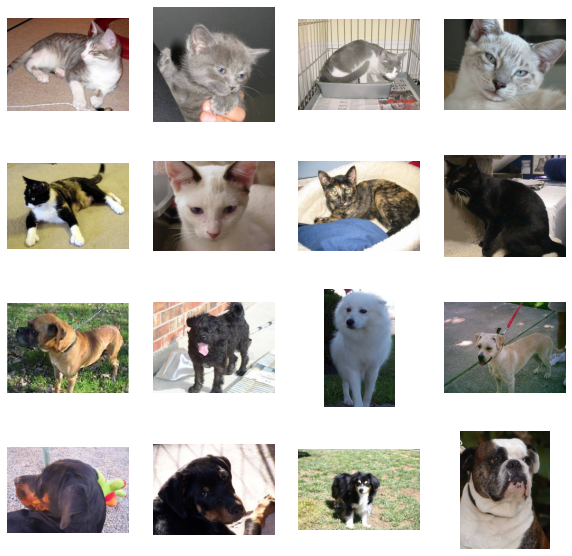

In [ ]:
import matplotlib.pylab as plt
# Set up matplotlib fig, and size it to fit 4x4 pics
import matplotlib.image as mpimg
nrows = 4
ncols = 4

fig, axs = plt.subplots(4, 4)
fig.set_size_inches(10, 10)
# fig.set_size_inches(ncols*2, nrows*2)
# pic_index = 100

for i, img_path in enumerate(next_cat_pix+next_dog_pix):
  # Set up subplot; subplot indices start at 1
  # sp = plt.subplot(nrows, ncols, i + 1)
  sp = axs.flat[i]
  sp.axis('Off') # Don't show axes (or gridlines)

  img = mpimg.imread(img_path)
  # print(img.shape)
  sp.imshow(img)

plt.show()

In [ ]:
print(type(axs))
print(axs)
print(axs[0][0])

<class 'numpy.ndarray'>
[[<matplotlib.axes._subplots.AxesSubplot object at 0x7fac4c848e50>
AxesSubplot(0.125,0.657941;0.227941x0.222059)


In [ ]:
# Add our data-augmentation parameters to ImageDataGenerator
train_datagen = ImageDataGenerator(rescale = 1./255.,
                                   rotation_range = 40,
                                   width_shift_range = 0.2,
                                   height_shift_range = 0.2,
                                   shear_range = 0.2,
                                   zoom_range = 0.2,
                                   horizontal_flip = True)

# Note that the validation data should not be augmented!
validation_datagen = ImageDataGenerator( rescale = 1.0/255. )
# Note that the validation data should not be augmented!
test_datagen = ImageDataGenerator( rescale = 1.0/255. )

# Flow training images in batches of 20 using train_datagen generator
train_generator = train_datagen.flow_from_directory(train_dir,
                                                    batch_size = 32,
                                                    class_mode = 'binary', 
                                                    target_size = (ImgX, ImgY))     

# Flow validation images in batches of 20 using test_datagen generator
validation_generator =  validation_datagen.flow_from_directory( validation_dir,
                                                          batch_size  = 32,
                                                          class_mode  = 'binary', 
                                                          target_size = (ImgX, ImgY))

# Flow validation images in batches of 20 using test_datagen generator
test_generator =  test_datagen.flow_from_directory( test_dir,
                                                          batch_size  = 1,
                                                          class_mode  = 'binary', 
                                                          target_size = (ImgX, ImgY))

Found 2000 images belonging to 2 classes.
Found 958 images belonging to 2 classes.
Found 42 images belonging to 2 classes.


In [ ]:
# datagen = ImageDataGenerator()
# train_datagen = datagen.flow_from_directory(train_dir, class_mode='binary', batch_size=64)

Found 2000 images belonging to 2 classes.


In [ ]:
# batchX, batchy = train_datagen.next()
# print('Batch shape=%s, min=%.3f, max=%.3f' % (batchX.shape, batchX.min(), batchX.max()))

Batch shape=(64, 256, 256, 3), min=0.000, max=255.000


In [ ]:
from tensorflow.keras.applications.inception_v3 import InceptionV3

pre_trained_model = InceptionV3(input_shape = (ImgX, ImgY, 3), # Shape of our images
                                include_top = False, # Leave out the last fully connected layer
                                weights = 'imagenet')

In [ ]:
for layer in pre_trained_model.layers:
  layer.trainable = False

In [ ]:
class myCallback(tf.keras.callbacks.Callback):
  def on_epoch_end(self, epoch, logs={}):
    if(logs.get('acc') > 0.959):
      print("\nReached 95.9% accuracy so cancelling training!")
      self.model.stop_training = True

In [ ]:
from tensorflow.keras.optimizers import RMSprop

# Flatten the output layer to 1 dimension
x = layers.Flatten()(pre_trained_model.output)
# Add a fully connected layer with 1,024 hidden units and ReLU activation
x = layers.Dense(1024, activation='relu')(x)
# Add a dropout rate of 0.2
x = layers.Dropout(0.2)(x)                  
# Add a final sigmoid layer for classification
x = layers.Dense  (1, activation='sigmoid')(x)           

model = Model( pre_trained_model.input, x) 

model.compile(optimizer = RMSprop(lr=0.0001), 
              loss = 'binary_crossentropy', 
              metrics = ['acc'])

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/optimizer_v2.py:356: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  "The `lr` argument is deprecated, use `learning_rate` instead.")


In [ ]:
print(b)

[1. 0. 1. 0. 1. 0. 1. 1. 1. 1. 0. 1. 1. 0. 1. 1. 0. 1. 0. 1. 1. 0. 1. 1.
 1. 1. 1. 1. 0. 0. 0. 0.]


In [ ]:
callbacks = myCallback()
history = model.fit(
            train_generator,
            validation_data = validation_generator,
            # steps_per_epoch = 100,
            epochs = 100,
            validation_steps = 50,
            verbose = 2,
            callbacks=[callbacks])


Epoch 1/100
63/63 - 274s - loss: 1.2583 - acc: 0.9110 - val_loss: 0.1101 - val_acc: 0.9812
Epoch 2/100
63/63 - 41s - loss: 0.2879 - acc: 0.9575
Epoch 3/100
63/63 - 41s - loss: 0.3020 - acc: 0.9565
Epoch 4/100
63/63 - 41s - loss: 0.1973 - acc: 0.9675

Reached 95.9% accuracy so cancelling training!


In [ ]:
file_name = os.path.join(base_dir, "Model", "original_code.h5")
model.save(file_name)

<class 'keras.callbacks.History'>


In [ ]:
print(model.predict_classes(test_generator))

AttributeError: ignored

In [ ]:
preds = model.predict(test_generator)
preds = np.round(preds).astype(int)

In [ ]:
predicted_class_indices = np.argmax(preds,axis=1)
print(predicted_class_indices)

[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0]


In [ ]:
labels = (test_generator.class_indices)
print(labels)
labels = dict((v,k) for k,v in labels.items())
print(labels)

{'cats': 0, 'dogs': 1}
{0: 'cats', 1: 'dogs'}


In [ ]:
model.evaluate(test_generator)

42/42 [==============================] - 2s 38ms/step - loss: 5.8863e-09 - acc: 1.0000


[5.8862648089075265e-09, 1.0]

### AutoKeras

In [ ]:
# !pip install autokeras

In [ ]:
import autokeras as ak
train_data = ak.image_dataset_from_directory(train_dir)
validation_data = ak.image_dataset_from_directory(validation_dir)
test_data = ak.image_dataset_from_directory(test_dir)


Found 6970 files belonging to 2 classes.
Found 775 files belonging to 2 classes.
Found 861 files belonging to 2 classes.
time: 487 ms


In [ ]:
# Initialize the image classifier.
clf = ak.ImageClassifier(overwrite=True, max_trials=1)
# Feed the image classifier with training data.



time: 20.7 ms


In [ ]:
files = list(pathlib.Path(train_dir).glob('**/*.jpg'))
print(len(files))
for file in files:
  print(file)

In [ ]:

clf.fit(train_data, validation_data=validation_data, epochs=10, verbose=1)

In [ ]:
clf.evaluate(test_data)

In [ ]:
!nvidia-smi

In [ ]:
print(preds)

In [ ]:
import matplotlib.pyplot as plt
acc = history.history['acc']
val_acc = history.history['val_acc']
loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(len(acc))

plt.plot(epochs, acc, 'bo', label='Training accuracy')
plt.plot(epochs, val_acc, 'b', label='Validation accuracy')
plt.title('Training and validation accuracy')
plt.legend()
plt.figure()

plt.plot(epochs, loss, 'b-', label='Training Loss')
plt.plot(epochs, val_loss, 'r--', label='Validation Loss')
plt.title('Training and validation loss')
plt.legend()

plt.show()

In [ ]:
!pip install autokeras

In [ ]:
import numpy as np
import tensorflow as tf
from tensorflow.keras.datasets import mnist

import autokeras as ak

(x_train, y_train), (x_test, y_test) = mnist.load_data()
print(x_train.shape)  # (60000, 28, 28)
print(y_train.shape)  # (60000,)
print(y_train[:3])  # array([7, 2, 1], dtype=uint8)

# Initialize the image classifier.
clf = ak.ImageClassifier(overwrite=True, max_trials=1)
# Feed the image classifier with training data.
clf.fit(x_train, y_train, epochs=10)


# Predict with the best model.
predicted_y = clf.predict(x_test)
print(predicted_y)


# Evaluate the best model with testing data.
print(clf.evaluate(x_test, y_test))

In [ ]:
%tensorflow_version 2.x

# Dataset preparation

### Data summary

In [ ]:
dataset_real_dir = "/home/mdabdullahal.alamin/alamin/face_mask/dataset/RMFD/organized/"
dataset_simulated_dir = "/home/mdabdullahal.alamin/alamin/face_mask/dataset/masknet/organized/"

utils.get_list_of_image_from_directory(dataset_real_dir)
utils.get_list_of_image_from_directory(dataset_simulated_dir)
print("over")

Total 12843 images found in directory /home/mdabdullahal.alamin/alamin/face_mask/dataset/RMFD/organized/
Total 12844 images found in directory /home/mdabdullahal.alamin/alamin/face_mask/dataset/masknet/organized/
over
time: 5.96 s


### Data migration

In [ ]:
from sklearn.model_selection import train_test_split
import shutil


def get_train_validation_test_split(X, y):
    X_train, X_test, y_train, y_test = train_test_split( X, y, test_size=0.10, random_state=42)
    print("Initial Train size: %d Test size: %d" % (len(X_train), len(X_test)))
    X_train, X_validation, y_train, y_validation = train_test_split( X_train, y_train, test_size=0.12, random_state=52)
    print("Train size: %d Validation size: %d Test size: %d" % (len(X_train), len(X_validation), len(X_test)))
    return X_train, X_validation, X_test, y_train, y_validation, y_test



# uses global variable classes
def copy_to_standard_folder_structure(target_dir, X, y, classes):
    print("Tagget dir: %s and len: %d" % (target_dir, len(X)))
    remove_directory(target_dir)
    create_directory(target_dir)
    for class_type in classes:
        dir_name = os.path.join(target_dir, class_type)
        create_directory(dir_name)
    for i in range(len(X)):
        org_img_path = str(X[i])
        org_img_path_ext = org_img_path[-4:]
        new_img_name = str(i) + org_img_path_ext
        new_img_path = os.path.join(target_dir, y[i], new_img_name)
        if(i % 500 == 0):
            print(new_img_path)
        shutil.copyfile(org_img_path, new_img_path)
        # break
    print("\n\n\n ============ Copy Over ========== \n\n")



time: 4.12 ms


In [ ]:
Samples_per_class = 6422

dataset_real = "/home/mdabdullahal.alamin/alamin/face_mask/dataset/RMFD/Org_dataset/"
dataset_real_organized = "/home/mdabdullahal.alamin/alamin/face_mask/dataset/RMFD/organized/"

dataset_simulated = "/home/mdabdullahal.alamin/alamin/face_mask/dataset/masknet/data_org/"
dataset_simulated_organized = "/home/mdabdullahal.alamin/alamin/face_mask/dataset/masknet/organized/"


time: 496 µs


In [ ]:
# print(len(get_list_of_image_from_directory("/home/mdabdullahal.alamin/alamin/face_mask/dataset/masknet/data_org/without_mask/", ".png")))

Total 65534 images found in directory /home/mdabdullahal.alamin/alamin/face_mask/dataset/masknet/data_org/without_mask/
65534
time: 807 ms


In [ ]:
def process_raw_data(data_dir, output_dir):
    mask_dir = os.path.join(data_dir, "mask")
    without_mask_dir = os.path.join(data_dir, "without_mask")

    mask_samples = get_list_of_image_from_directory(mask_dir)
    without_mask_samples = get_list_of_image_from_directory(without_mask_dir)
    if(len(without_mask_samples) < 10):
        without_mask_samples = get_list_of_image_from_directory(without_mask_dir, ".png")
        

    print("mask samples: %d without_mask samples: %d" % (len(mask_samples), len(without_mask_samples)))

    random.seed(100)
    mask_selected_samples = random.sample(mask_samples, Samples_per_class)
    random.seed(100)
    without_mask_selected_samples = random.sample(without_mask_samples, Samples_per_class)
  

    # print(correct_mask_selected_images)
    # print(incorrect_mask_selected_images)

    X_all = mask_selected_samples + without_mask_selected_samples
    Y_all = ["mask"] * len(mask_selected_samples) + ["without_mask"] * len(without_mask_selected_samples)
    assert len(X_all) == len(Y_all)
    print("Total samples: %d" % len(X_all))


    X_train, X_validation, X_test, y_train, y_validation, y_test = get_train_validation_test_split(X_all, Y_all)
    print("Train: %d Validation: %d Test: %d" % (len(X_train), len(X_validation), len(X_test)))


    CLASS_NAMES = ["mask", "without_mask"]

    train_dir = os.path.join(output_dir, "train/")
    validation_dir = os.path.join(output_dir, "validation/")
    test_dir = os.path.join(output_dir, "test/")

    print(output_dir, train_dir, validation_dir, test_dir)


    copy_to_standard_folder_structure(validation_dir, X_validation, y_validation, CLASS_NAMES )
    copy_to_standard_folder_structure(test_dir, X_test, y_test, CLASS_NAMES)
    copy_to_standard_folder_structure(train_dir, X_train, y_train, CLASS_NAMES)

    print("\n\n   ==========> Data has been moved to correct directory: %s \n\n" % output_dir)


# process_raw_data(dataset_real, dataset_real_organized)
process_raw_data(dataset_simulated, dataset_simulated_organized)


### Data cleaning

In [ ]:
from PIL import Image
def get_incorrect_images(img_list):
  res = []
  for img in img_list:
    try:
      Image.open(img)      
    except Exception:
      print("This image is invalid and so removing: %s" % (img))
      res.append(img)
  return res

time: 617 µs


In [ ]:
dataset_real_dir = "/home/mdabdullahal.alamin/alamin/face_mask/dataset/RMFD/organized/"
dataset_simulated_dir = "/home/mdabdullahal.alamin/alamin/face_mask/dataset/masknet/organized/"

real_images = get_list_of_image_from_directory(dataset_real_dir)
simulated_images = get_list_of_image_from_directory(dataset_simulated_dir)

Total 12844 images found in directory /home/mdabdullahal.alamin/alamin/face_mask/dataset/RMFD/organized/
Total 12844 images found in directory /home/mdabdullahal.alamin/alamin/face_mask/dataset/masknet/organized/
time: 4.15 s


In [ ]:
real_incorrect_images = get_incorrect_images(real_images)
print(real_incorrect_images)

This image is invalid and so removing: /home/mdabdullahal.alamin/alamin/face_mask/dataset/RMFD/organized/train/mask/4320.jpg
[PosixPath('/home/mdabdullahal.alamin/alamin/face_mask/dataset/RMFD/organized/train/mask/4320.jpg')]
time: 56.8 s


In [ ]:
simulated_incorrect_images = get_incorrect_images(simulated_images)
print(simulated_incorrect_images)

[]
time: 1min 29s


In [ ]:
for img in real_incorrect_images:
    os.remove(img)


time: 5.52 ms


### Data visualization

In [ ]:
reload(utils)

<module 'utils' from '/home/mdabdullahal.alamin/alamin/Utility/utils.py'>

time: 18.6 ms


In [ ]:
def dataset_visualization(image_dir, N=8, title=None):
    images = utils.get_list_of_image_from_directory(image_dir)
    random.seed(50)
    samples = random.sample(images, N)
    utils.image_visualization(samples, title=title)

time: 557 µs


#### Real dataset

Total 5095 images found in directory /home/mdabdullahal.alamin/alamin/face_mask/dataset/RMFD/organized/train/mask/


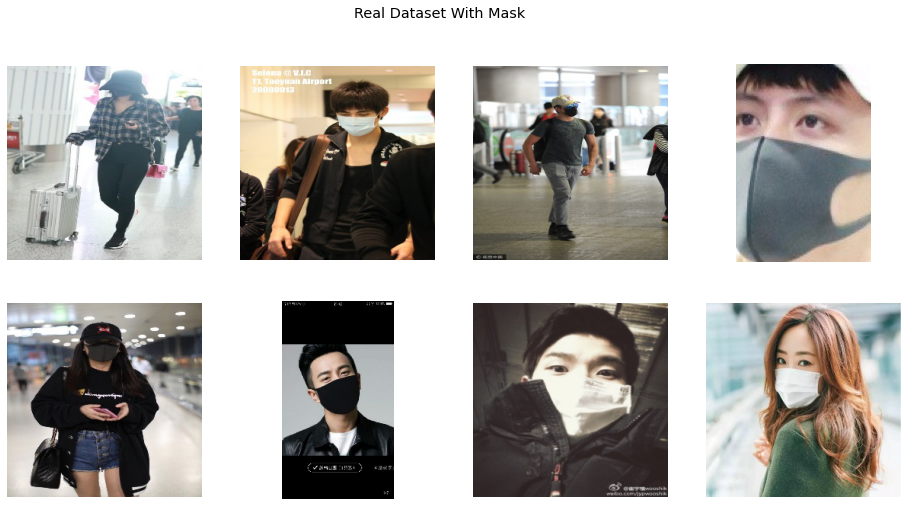

Total 5075 images found in directory /home/mdabdullahal.alamin/alamin/face_mask/dataset/RMFD/organized/train/without_mask/


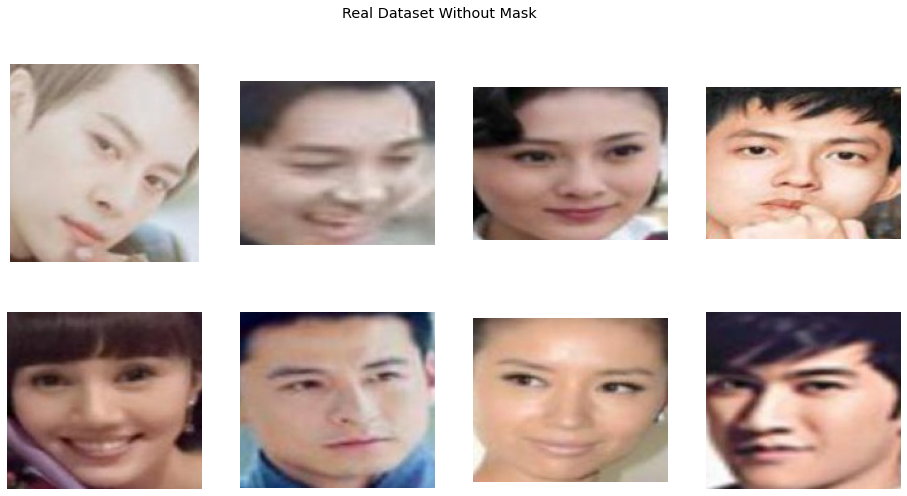

<Figure size 432x288 with 0 Axes>

time: 3.63 s


In [ ]:
real_dataset_mask = "/home/mdabdullahal.alamin/alamin/face_mask/dataset/RMFD/organized/train/mask/"
real_dataset_withoutmask = "/home/mdabdullahal.alamin/alamin/face_mask/dataset/RMFD/organized/train/without_mask/"

dataset_visualization(real_dataset_mask,  title="Real Dataset With Mask")
dataset_visualization(real_dataset_withoutmask,  title="Real Dataset Without Mask")

#### Simulated

Total 5096 images found in directory /home/mdabdullahal.alamin/alamin/face_mask/dataset/masknet/organized/train/mask/


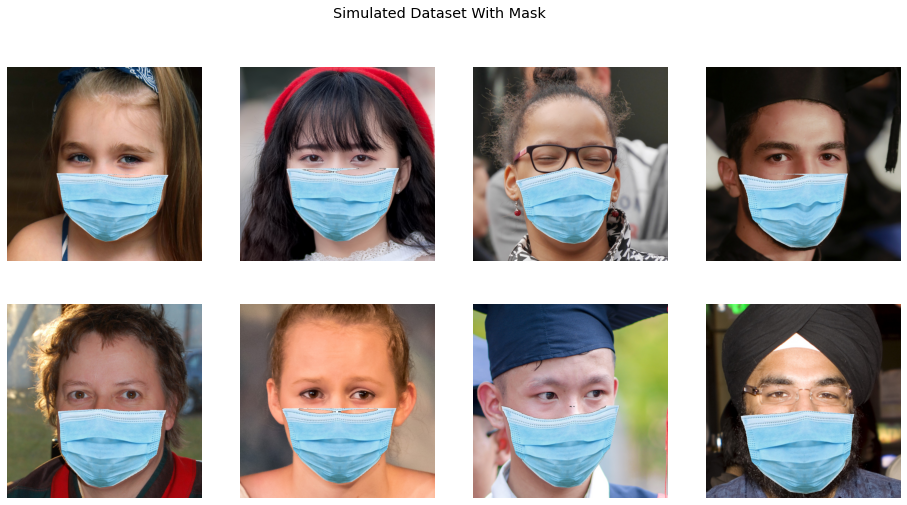

Total 5075 images found in directory /home/mdabdullahal.alamin/alamin/face_mask/dataset/masknet/organized/train/without_mask/


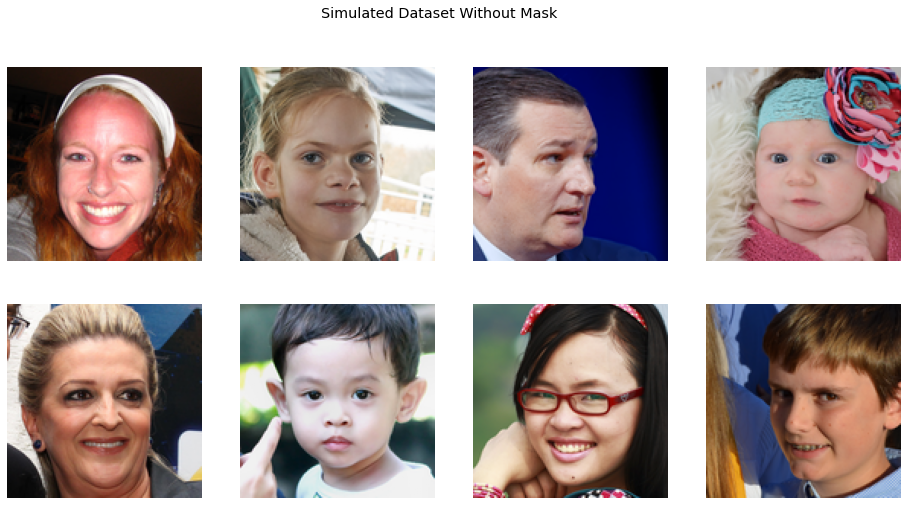

<Figure size 432x288 with 0 Axes>

time: 5.83 s


In [ ]:
simulated_dataset_mask = "/home/mdabdullahal.alamin/alamin/face_mask/dataset/masknet/organized/train/mask/"
simulated_dataset_withoutmask = "/home/mdabdullahal.alamin/alamin/face_mask/dataset/masknet/organized/train/without_mask/"

dataset_visualization(simulated_dataset_mask, title="Simulated Dataset With Mask")
dataset_visualization(simulated_dataset_withoutmask, title="Simulated Dataset Without Mask")

# Deep learning Models

## Variable initialization

Model configuration related global initialization parameters

In [ ]:
img_W = 128
img_H = 128
BS = 128 # batch size
INPUT_SHAPE = (img_W, img_H, 3)
CLASS_NAMES = ["mask", "without_mask"]

current_dataset = "real"

BASE_DIR = "/home/mdabdullahal.alamin/alamin/face_mask"
if current_dataset == "real":
    data_dir = "/home/mdabdullahal.alamin/alamin/face_mask/dataset/RMFD/organized/"
if current_dataset == "simulated":
    data_dir = "/home/mdabdullahal.alamin/alamin/face_mask/dataset/masknet/organized/"
model_output_dir = os.path.join(BASE_DIR, "model_output", current_dataset)


train_dir = os.path.join(data_dir, "train/")
validation_dir = os.path.join(data_dir, "validation/")
test_dir = os.path.join(data_dir, "test/")


utils.get_list_of_image_from_directory(train_dir)
utils.get_list_of_image_from_directory(validation_dir)
utils.get_list_of_image_from_directory(test_dir)
print("Over")


Total 10170 images found in directory /home/mdabdullahal.alamin/alamin/face_mask/dataset/RMFD/organized/train/
Total 1388 images found in directory /home/mdabdullahal.alamin/alamin/face_mask/dataset/RMFD/organized/validation/
Total 1285 images found in directory /home/mdabdullahal.alamin/alamin/face_mask/dataset/RMFD/organized/test/
Over


In [ ]:
# BASE_DIR = "/content/drive/MyDrive/UofC/classes/619_ML/facemask_detection/"


# org_data_dir = pathlib.Path(BASE_DIR, "dataset_org")

# with_mask_org_dir = os.path.join(org_data_dir, "with_mask")
# with_mask_org_dir = pathlib.Path(with_mask_org_dir)

# without_mask_org_dir = os.path.join(org_data_dir, "without_mask")
# without_mask_org_dir = pathlib.Path(without_mask_org_dir)



# BASE_DIR = "/home/mdabdullahal.alamin/alamin/face_mask"
# # /home/mdabdullahal.alamin/alamin/face_mask/dataset/cats_dogs/cats_and_dogs_filtered/train/

# model_output_dir = os.path.join(BASE_DIR, "model_output", "cats_dogs")

# data_dir = pathlib.Path(BASE_DIR, "dataset", "cats_dogs", "cats_and_dogs_filtered")
# train_dir = os.path.join(data_dir,  "train/")
# validation_dir = os.path.join(data_dir,  "validation/")
# test_dir = os.path.join(data_dir,  "test/")

# CLASS_NAMES = ["cats", "dogs"]

#### Helper methods

In [ ]:
# summarize history for accuracy
def plot_training_accuracy(history, file_name, title):
    fig = plt.gcf()
    fig.set_size_inches(10, 5)
    plt.plot(history.history['accuracy'])
    plt.plot(history.history['val_accuracy'])
    plt.title(title)
    plt.ylabel('Accuracy')
    plt.xlabel('Epoch')
    plt.legend(['Train', 'Validation'], loc='best')
    plt.show()
    fig.savefig(file_name)

# summarize history for accuracy
def plot_training_loss(history, file_name, title):
    fig = plt.gcf()
    fig.set_size_inches(10, 5)
    plt.plot(history.history['loss'])
    plt.plot(history.history['val_loss'])
    plt.title(title)
    plt.ylabel('Loss')
    plt.xlabel('Epoch')
    plt.legend(['Train', 'Validation'], loc='best')
    plt.show()
    fig.savefig(file_name)

class Result:
    def __init__(self, y_true, y_pred, path):
        self.y_true = y_true
        self.y_pred = y_pred
        self.path = path        

    def __str__(self):
        return "True Label: %s\nPrediction: %s\nPath: %s\n" % (self.y_true, self.y_pred, self.path)


# test_image_files = test_generator.filenames
def get_wrongly_predicted_sample_indexes(y_true, y_pred, files):
    wrong_samples = []
    for i in range(len(y_true)):
      if y_true[i] != y_pred[i]:
        res = Result(y_true[i], y_pred[i], files[i])
        wrong_samples.append(res)
    print(len(wrong_samples))
    # print(wrong_samples)
    return wrong_samples

def visualize_incorrectly_predicted_samples(incorrectly_predicted_samples, base_dir, output_file):
    nrows = 8
    ncols = 4

    fig = plt.gcf()
    fig.set_size_inches(ncols*4, nrows*4)
    fig.tight_layout()
    # fig.subplots_adjust(top=0.2)
    fig.suptitle("Randomly sampled incorrectly predicted samples", fontsize="x-large", y=1.01)

    for i in range(min(len(incorrectly_predicted_samples), nrows*ncols)):
        # file_name = test_images[index]
        res = incorrectly_predicted_samples[i]
        file_path = os.path.join(base_dir, res.path)
        img = mpimg.imread(file_path)
        sp = plt.subplot(nrows, ncols, i + 1)
        title = "%s" % (res)
        sp.set_title(title)
        sp.axis('Off')
        plt.imshow(img)
    plt.tight_layout()
    # output_file = incorrectly_predicted_samples_file
    fig.savefig(output_file, dpi=200)


# useas global variable train_generator
def get_true_and_pred_labels(y_pred_model):
    y_pred_indices = np.argmax(y_pred_model, axis=1)
    labels = (train_generator.class_indices)
    labels = dict((v,k) for k,v in labels.items())

    y_true_classes = test_generator.classes
    y_true_labels = [ labels[k] for k in y_true_classes]

    y_pred_labels = [labels[k] for k in y_pred_indices]
    # print(y_pred_labels[:10])

    test_image_files = test_generator.filenames

    return y_true_labels, y_pred_labels, test_image_files


def save_to_csv(y_true_labels, y_pred_labels, test_image_files, output_file):
    df = pd.DataFrame()
    # abs_path = [os.path.join(test_dir, path) for path in test_image_files]
    df['sample']  = test_image_files
    df['true_label'] = y_true_labels
    df['predicted_label'] = y_pred_labels
    df['verdict'] = df['true_label'] == df['predicted_label']
    save_df(df, output_file)

def summary_output(text, file_name):
    with open(file_name, 'a') as f:
        print(text, file=f)


# plot_training_accuracy(training_history, training_accuracy_file, training_accuracy_title)
# plot_training_loss(training_history, training_accuracy_file, training_loss_title)

## Data Exploration

### Org dataset

In [ ]:
# !unzip /content/drive/MyDrive/UofC/classes/619_ML/facemask\ detection/RMFD.zip -d /content/drive/MyDrive/UofC/classes/619_ML/facemask\ detection/RMFD_python

#### Statistics

In [ ]:
# !find /content/drive/MyDrive/UofC/classes/619_ML/facemask_detection/dataset_org/ -type f | wc -l
# !find /content/drive/MyDrive/UofC/classes/619_ML/facemask_detection/dataset/without_mask -type f | wc -l

4266


In [ ]:
with_mask_dir = "/home/mdabdullahal.alamin/alamin/face_mask/dataset/RMFD/Org_dataset/with_mask/"
AFDB_mask_dir = "/home/mdabdullahal.alamin/alamin/face_mask/dataset/RMFD/Org_dataset/self-built-masked-face-recognition-dataset/AFDB_masked_face_dataset/"
AFDB_without_mask_dir = "/home/mdabdullahal.alamin/alamin/face_mask/dataset/RMFD/Org_dataset/self-built-masked-face-recognition-dataset/AFDB_face_dataset/"

time: 2.09 ms


In [ ]:
get_list_of_image_from_directory(with_mask_dir)
get_list_of_image_from_directory(AFDB_mask_dir)
get_list_of_image_from_directory(AFDB_without_mask_dir)
print("over")

Total 4304 images found in directory /home/mdabdullahal.alamin/alamin/face_mask/dataset/RMFD/Org_dataset/with_mask/
Total 2118 images found in directory /home/mdabdullahal.alamin/alamin/face_mask/dataset/RMFD/Org_dataset/self-built-masked-face-recognition-dataset/AFDB_masked_face_dataset/
Total 90468 images found in directory /home/mdabdullahal.alamin/alamin/face_mask/dataset/RMFD/Org_dataset/self-built-masked-face-recognition-dataset/AFDB_face_dataset/
over
time: 10.8 s


In [ ]:
print(with_mask_dir)
with_mask_images = list(with_mask_dir.glob('**/*.jpg'))
without_mask_images = list(without_mask_dir.glob('**/*.jpg'))

print("with_mask images %d" % (len(with_mask_images)))
print("without_mask images %d" % (len(without_mask_images)))

/content/drive/MyDrive/UofC/classes/619_ML/facemask_detection/dataset_org/with_mask
with_mask images 4304
without_mask images 92586


In [ ]:
# ds = tfds.load(name="facemask", data_dir=base_dir, split='train', as_supervised=True)
# ds = ds.take(1)

#### Class balancing

In [ ]:
from PIL import Image

def get_incorrect_images(img_list):
  res = []
  for img in img_list:
    try:
      Image.open(img)      
    except Exception:
      print("This image is invalid and so removing: %s" % (img))
      res.append(img)
  return res

time: 785 µs


In [ ]:
with_mask_chosen_images = with_mask_images.copy()
with_mask_chosen_images = get_correct_images(with_mask_chosen_images)
without_mask_chosen_images = without_mask_images.copy()
without_mask_chosen_images = random.sample(without_mask_chosen_images, len(with_mask_chosen_images))  ## Making with mask and without mask sample size equal
without_mask_chosen_images = get_correct_images(without_mask_chosen_images)
print("with_mask chosen images %d" % (len(with_mask_chosen_images)))
print("without_mask chosen images %d" % (len(without_mask_chosen_images)))

X_all = with_mask_chosen_images + without_mask_chosen_images
Y_all = ["mask"] * len(with_mask_chosen_images) + ["without_mask"] * len(without_mask_chosen_images)
assert len(X_all) == len(Y_all)

print("Total samples: %d" % len(X_all))

This image is invalid and so removing: /content/drive/MyDrive/UofC/classes/619_ML/facemask_detection/dataset_org/with_mask/RMFD_part_2/RWMFD_part_2_pro/00415/011.jpg
with_mask chosen images 4303
without_mask chosen images 4303
Total samples: 8606


In [ ]:
# save_obj(X_all, BASE_DIR, "X_all")
# save_obj(Y_all, BASE_DIR, "Y_all")

Total samples: 8606


time: 751 µs


In [ ]:
X_train, X_validation, X_test, y_train, y_validation, y_test = get_train_validation_test_split(X_all, Y_all)

Train size: 7745 Test size: 861
Train size: 6970 Validation size: 775 Test size: 861


#### Standard folder formation


In [ ]:
print("Alamin"[-2:])

in


In [ ]:
import shutil

# uses global variable classes
def copy_to_standard_folder_structure(target_dir, X, y, classes = CLASS_NAMES):
    print("Tagget dir: %s and len: %d" % (target_dir, len(X)))
    remove_directory(target_dir)
    create_directory(target_dir)
    for class_type in CLASS_NAMES:
        dir_name = os.path.join(target_dir, class_type)
        create_directory(dir_name)
    for i in range(len(X)):
        org_img_path = str(X[i])
        org_img_path_ext = org_img_path[-4:]
        new_img_name = str(i) + org_img_path_ext
        new_img_path = os.path.join(target_dir, y[i], new_img_name)
        if(i % 100 == 0):
            print(new_img_path)
        shutil.copyfile(org_img_path, new_img_path)
        # break



train_dir = os.path.join(BASE_DIR, "dataset", "train/")
validation_dir = os.path.join(BASE_DIR, "dataset", "validation/")
test_dir = os.path.join(BASE_DIR, "dataset", "test/")

# copy_to_standard_folder_structure(train_dir, X_train, y_train)
copy_to_standard_folder_structure(validation_dir, X_validation, y_validation)
# copy_to_standard_folder_structure(test_dir, X_test, y_test)


/content/drive/MyDrive/UofC/classes/619_ML/facemask_detection/dataset/validation/without_mask/400.jpg
/content/drive/MyDrive/UofC/classes/619_ML/facemask_detection/dataset/validation/without_mask/500.jpg
/content/drive/MyDrive/UofC/classes/619_ML/facemask_detection/dataset/validation/mask/600.jpg
/content/drive/MyDrive/UofC/classes/619_ML/facemask_detection/dataset/validation/without_mask/700.jpg


In [ ]:
# copy_to_standard_folder_structure(validation_dir, X_validation, y_validation)
copy_to_standard_folder_structure(test_dir, X_test, y_test)

In [ ]:
import shutil
des_dir = os.path.join(BASE_DIR, "dataset", "without_mask/")
remove_directory(des_dir)
create_directory(des_dir)
for img in without_mask_chosen_images:
  print(img)
  shutil.copy(img, des_dir)

In [ ]:
import shutil
des_dir = os.path.join(BASE_DIR, "dataset", "mask/")
remove_directory(des_dir)
create_directory(des_dir)
for img in with_mask_chosen_images:
  print(img)
  shutil.copy(img, des_dir)
  # break

### Samples visualization

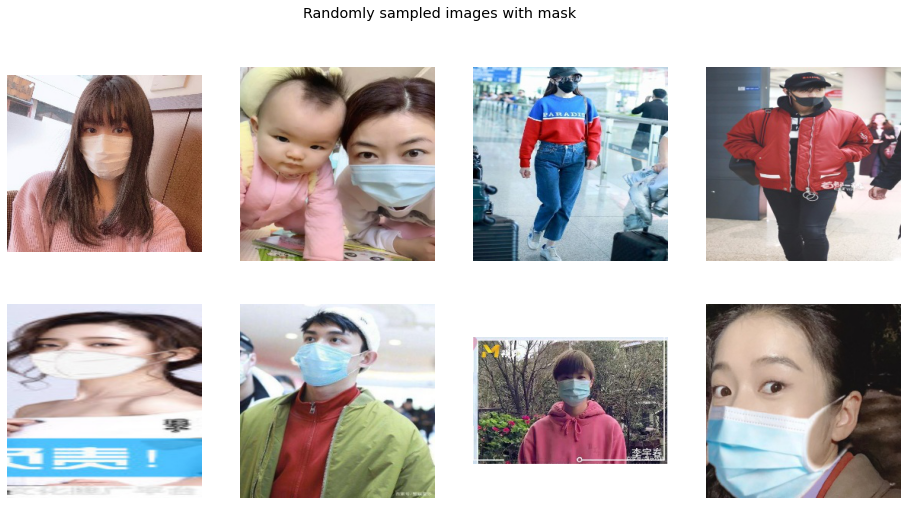

In [ ]:
nrows = 2
ncols = 4

fig = plt.gcf()
fig.set_size_inches(ncols*4, nrows*4)
fig.tight_layout()
fig.suptitle("Randomly sampled images with mask", fontsize="x-large")

for i in range(8):
    img_ind = random.randint(0, len(with_mask_chosen_images))
    img = mpimg.imread(with_mask_chosen_images[img_ind])
    sp = plt.subplot(nrows, ncols, i + 1)
    sp.axis('Off')
    plt.imshow(img)



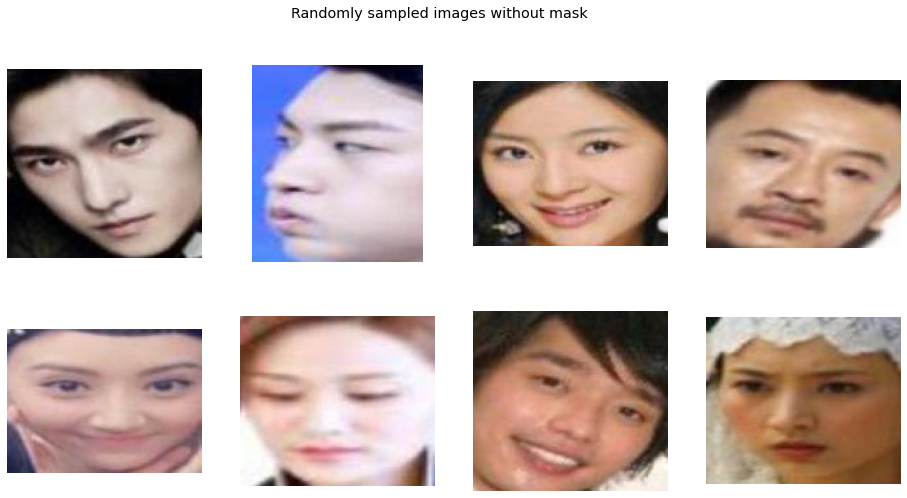

In [ ]:
fig = plt.gcf()
fig.set_size_inches(ncols*4, nrows*4)
fig.tight_layout()
fig.suptitle("Randomly sampled images without mask", fontsize="x-large")

for i in range(8):
    img_ind = random.randint(0, len(without_mask_chosen_images))
    img = mpimg.imread(without_mask_chosen_images[img_ind])
    sp = plt.subplot(nrows, ncols, i + 1)
    sp.axis('Off')
    plt.imshow(img)

## Data preparation

#### Data Augmentation

In [ ]:
def get_augmentation_params():
    gen_params = {"featurewise_center":False,\
              "samplewise_center":False,\
              "featurewise_std_normalization":False,\
              "samplewise_std_normalization":False,\
              "zca_whitening":False,\
              "rotation_range":20,\
              "width_shift_range":0.1,\
              "height_shift_range":0.1, \
              "shear_range":0.2, \
              "zoom_range":0.1,\
              "horizontal_flip":True,\
              "vertical_flip":True}
    return gen_params

def get_data_generator_from_directory(dir_path, is_test_data=False):
    # Data generator parameters
    gen_params = get_augmentation_params()

   
    shuffle = True
    if(is_test_data):
      generator = ImageDataGenerator(preprocessing_function = tf.keras.applications.efficientnet.preprocess_input)
      shuffle = False
    else:
      # For training and validation dataset
      generator = ImageDataGenerator(**gen_params, preprocessing_function = tf.keras.applications.efficientnet.preprocess_input)

    data_generator = generator.flow_from_directory(
        directory = dir_path,
        target_size=(img_W, img_H),
        color_mode="rgb",
        classes= CLASS_NAMES,
        class_mode="categorical",
        batch_size=BS,
        shuffle=shuffle,
        seed=84,
        interpolation="nearest",
    )
    return data_generator

train_generator = get_data_generator_from_directory(train_dir)
validation_generator = get_data_generator_from_directory(validation_dir)
test_generator = get_data_generator_from_directory(test_dir, is_test_data=True)

Found 10170 images belonging to 2 classes.
Found 1388 images belonging to 2 classes.
Found 1285 images belonging to 2 classes.


### Visualize Generated Image

In [ ]:

def visualize_augmented_images(image_path):
    
    image = load_img(image_path)
    image = img_to_array(image)
    image = image.reshape((1, image.shape[0], image.shape[1], image.shape[2]))
    generator = ImageDataGenerator(**get_augmentation_params())
    imageGen = generator.flow(my_image)


    nrows = 4
    ncols = 4

    fig = plt.gcf()
    fig.set_size_inches(ncols*4, nrows*4)
    fig.tight_layout()
    fig.suptitle("Randomly sampled augmented images", fontsize="x-large")

    total = 0
    for i in range (nrows * ncols):
        img = imageGen.next()[0]
        sp = plt.subplot(nrows, ncols, i+1)
        sp.axis('Off')
        plt.imshow(img.astype(np.uint8))


time: 855 µs


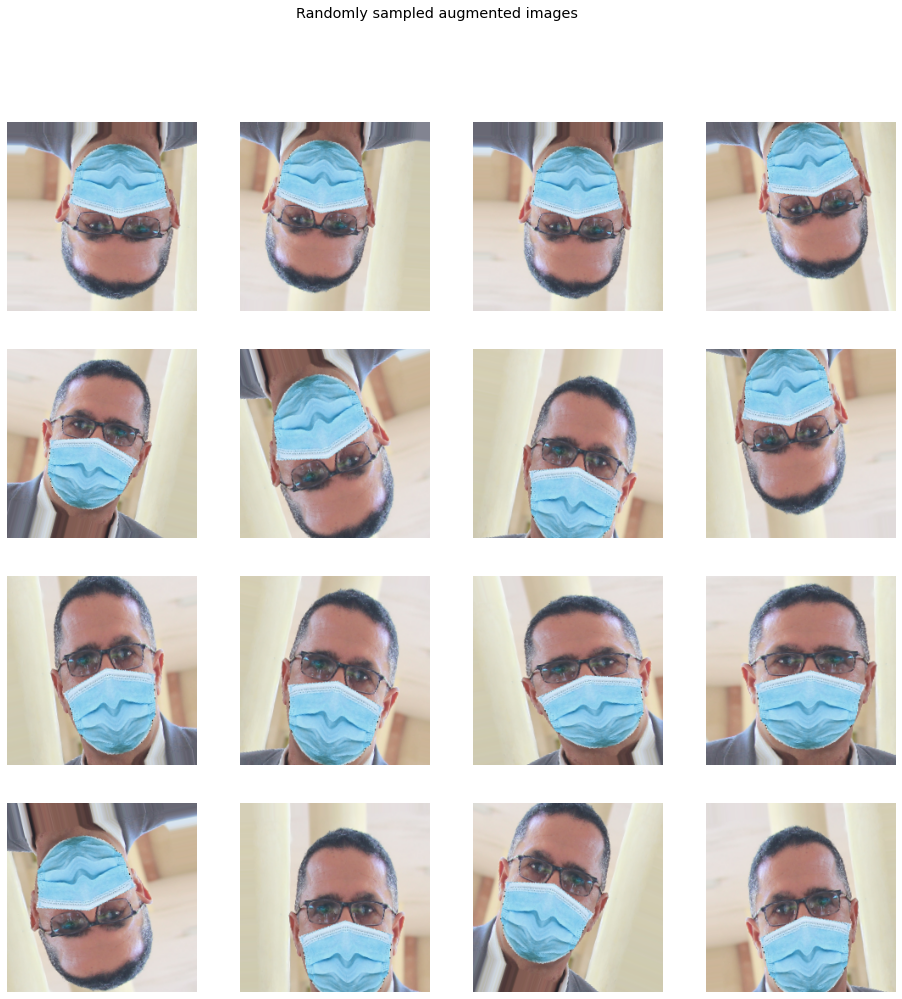

time: 1.81 s


In [ ]:
image_path = "/home/mdabdullahal.alamin/alamin/face_mask/dataset/masknet/organized/train/correct/0.jpg"
visualize_augmented_images(image_path)

In [ ]:


# print(" loading example image...")

# image = load_img(image_path)
# print(mpimg.imread(image_path))
# image = img_to_array(image)
# print(type(image), len(image))
# # image = np.expand_dims(image, axis=0)
# print(type(image), len(image))

time: 27.2 ms


In [ ]:
generator = ImageDataGenerator(**get_augmentation_params())
imageGen = generator.flow(my_image)
print("[INFO] generating images...")

batch_image = imageGen.next()
print(type(batch_image))
print(batch_image.shape)
print(len(batch_image))
print(len(batch_image[0]))


# imageGen = generator.flow(image, target_size=(img_W, img_H), batch_size=1, save_to_dir=augmentation_dir, save_prefix="image", save_format="jpg")

# # loop over examples from our image data augmentation generator
# total = 0
# for image in imageGen:
#     # increment our counter
#     total += 1
#     # if we have reached the specified number of examples, break
#     # from the loop
#     print(image)
#     if total == 10:
#       break

[INFO] generating images...
<class 'numpy.ndarray'>
(1, 224, 224, 3)
1
224
time: 17.3 ms


In [ ]:
# # User global configuration variable Batch Size (BS)
# # User global configuration variable CLASS_NAMES
# def get_data_generator(raw_X, raw_Y, is_test_data=False):
#     # raw_data: a list containing absolute path of the images

#     # Data generator parameters
#     gen_params = {"featurewise_center":False,\
#                   "samplewise_center":False,\
#                   "featurewise_std_normalization":False,\
#                   "samplewise_std_normalization":False,\
#                   "zca_whitening":False,\
#                   "rotation_range":20,\
#                   "width_shift_range":0.1,\
#                   "height_shift_range":0.1, \
#                   "shear_range":0.2, \
#                   "zoom_range":0.1,\
#                   "horizontal_flip":True,\
#                   "vertical_flip":True}
   

#     dataframe = pd.DataFrame()
#     raw_X_str = [str(path) for path in raw_X]
#     dataframe['img_path'] = raw_X_str
#     dataframe['class'] = raw_Y

#     shuffle = True
#     if(is_test_data):
#       generator = ImageDataGenerator(preprocessing_function = tf.keras.applications.efficientnet.preprocess_input)
#       shuffle = False
#     else:
#       # For training and validation dataset
#       generator = ImageDataGenerator(**gen_params, preprocessing_function = tf.keras.applications.efficientnet.preprocess_input)

#     data_generator = generator.flow_from_dataframe(
#         dataframe, directory=None, x_col='img_path', y_col='class',
#         target_size=(img_W, img_H),
#         color_mode='rgb',
#         classes=CLASS_NAMES, 
#         class_mode='categorical', 
#         batch_size=BS, 
#         shuffle=shuffle,
#         seed=84,
#         interpolation='nearest',
#         validate_filenames=True
#         )

#     return data_generator








## Callbacks

In [ ]:
class MyThresholdCallback(tf.keras.callbacks.Callback):
    def __init__(self, threshold):
        super(MyThresholdCallback, self).__init__()
        self.threshold = threshold

    # This will stop the training when validation accurary is equal or above the threashole, 100% by default
    def on_epoch_end(self, epoch, logs=None): 
        val_acc = logs["val_accuracy"]
        print("=========================> Epoch is finished and validation accuracy is: %.2f" % val_acc, flush=True)
        if val_acc >= self.threshold:
            print("Validation accurary is higher than the threadhold %.2f and so stopping training" % (self.threshold))
            self.model.stop_training = True

def get_callbacks(model_checkpoint_path, threadhold=1):
   

    early_stop = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience = 3)


    monitor_it = tf.keras.callbacks.ModelCheckpoint(model_checkpoint_path, monitor='val_loss',\
                                                verbose=0,save_best_only=True,\
                                                save_weights_only=False,\
                                                mode='min')

    def scheduler(epoch, lr):
        if epoch%10 == 0 and epoch!= 0:
            lr = lr/2
        return lr

    lr_schedule = tf.keras.callbacks.LearningRateScheduler(scheduler,verbose = 0)

    threshold_callback = MyThresholdCallback(threshold=threadhold)

    return early_stop, monitor_it, lr_schedule, threshold_callback




# model_name = "facemask_classifier_tl_efficientnet.h5"
# model_checkpoint_path = os.path.join(BASE_DIR, "ckpt", model_name)
# early_stop, monitor_it, lr_schedule, threshold_callback = get_callbacks(model_checkpoint_path)

## Model Design

### Baseline

In [ ]:
# very simple baseline CNN model.
# source: https://www.freecodecamp.org/news/creating-your-first-image-classifier/

# it uses Global variable CLASS_NAMES and INPUT_SHAPE
# ============================================================== Model design  ======================================
def baseline_model_1():
    model = tf.keras.models.Sequential(name="Baseline_1VGG")
    model.add(tf.keras.layers.BatchNormalization(input_shape=INPUT_SHAPE))
    model.add(tf.keras.layers.Conv2D(32, (3, 3), padding='same', activation='relu'))
    model.add(tf.keras.layers.MaxPooling2D(pool_size=(2, 2), strides=(2,2)))

    model.add(tf.keras.layers.Flatten())
    model.add(tf.keras.layers.Dense(128, activation='relu'))
    model.add(tf.keras.layers.Dense(len(CLASS_NAMES), activation='softmax'))
    return model


def baseline_model_2():
    model = tf.keras.models.Sequential(name="Baseline_1VGG_dropout")
    model.add(tf.keras.layers.BatchNormalization(input_shape=INPUT_SHAPE))
    model.add(tf.keras.layers.Conv2D(32, (3, 3), padding='same', activation='relu'))
    model.add(tf.keras.layers.MaxPooling2D(pool_size=(2, 2), strides=(2,2)))
    model.add(tf.keras.layers.Dropout(0.20))
    
    model.add(tf.keras.layers.Flatten())
    model.add(tf.keras.layers.Dense(128, activation='relu'))
    model.add(tf.keras.layers.Dropout(0.2))
    model.add(tf.keras.layers.Dense(len(CLASS_NAMES), activation='softmax'))
    return model


def get_model(model_name):
    if(model_name == "Baseline_model_1"):
        return baseline_model_1()
    if(model_name == "Baseline_model_2"):
        return baseline_model_2()
    if(model_name == "VGG19_without_transfer_learning"):
        return get_VGG19_model()
    if(model_name == "VGG19_transfer_learning"):
        return get_VGG19_transfer_learning_model()
    if(model_name == "Resnet50"):
        return get_Resnet50_model()
    if(model_name == "Resnet50_transfer_learning"):
        return get_Resnet50_transfer_learning_model()

# print(model_name)
# model = get_model(model_name)
# model.summary()
# baseline_model_1().summary()
# baseline_model_2().summary()

In [ ]:
baseline_model_1().summary()

Model: "Baseline_1VGG"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 batch_normalization (BatchN  (None, 128, 128, 3)      12        
 ormalization)                                                   
                                                                 
 conv2d (Conv2D)             (None, 128, 128, 32)      896       
                                                                 
 max_pooling2d (MaxPooling2D  (None, 64, 64, 32)       0         
 )                                                               
                                                                 
 flatten (Flatten)           (None, 131072)            0         
                                                                 
 dense (Dense)               (None, 128)               16777344  
                                                                 
 dense_1 (Dense)             (None, 2)               

### VGG19

In [ ]:
#uses globabl variable num_classes and input_shape
def get_VGG19_model():
    model = tf.keras.applications.vgg19.VGG19(
      include_top=True,
      weights=None,
      input_tensor=None,
      input_shape=INPUT_SHAPE, 
      pooling=None, 
      classes=len(CLASS_NAMES),
      classifier_activation='softmax'
    )
    # print(model.summary())
    
    return model


# model = get_VGG19_model()
# print(model.summary())

time: 451 µs


### VGG19_transfer_learning

In [ ]:
#uses globabl variable num_classes and input_shape 
def get_VGG19_transfer_learning_model():
    base_model = tf.keras.applications.vgg19.VGG19(
      include_top=False,
      weights='imagenet',
      input_shape=INPUT_SHAPE,
    )
    base_model.trainable = False
    # for layer in base_model.layers:
    #     layer.trainable = False


    # print(model.summary())
    x1 = base_model(base_model.input, training = False)
    x2 = tf.keras.layers.Flatten()(x1)
    out = tf.keras.layers.Dense(len(CLASS_NAMES), activation = 'softmax')(x2)
    model = tf.keras.Model(inputs = base_model.input, outputs=out)
    print(model.summary())
    return model

# get_VGG19_transfer_learning()

time: 594 µs


### ResNet50

In [ ]:
#uses globabl variable num_classes and input_shape
def get_Resnet50_model():
    model = tf.keras.applications.resnet50.ResNet50(
      include_top=True,
      weights=None,
      input_tensor=None,
      input_shape=INPUT_SHAPE, 
      pooling=None, 
      classes=len(CLASS_NAMES),
      classifier_activation='softmax'
    )
    # print(model.summary())
    return model



time: 439 µs


### ResNet50_transfer_learning

In [ ]:
def get_Resnet50_transfer_learning_model():
    base_model = tf.keras.applications.resnet50.ResNet50(
      include_top=False,
      weights='imagenet',
      input_shape=INPUT_SHAPE,
    )
    base_model.trainable = False

    # print(model.summary())
    x1 = base_model(base_model.input, training = False)
    x2 = tf.keras.layers.Flatten()(x1)
    out = tf.keras.layers.Dense(len(CLASS_NAMES),activation = 'softmax')(x2)
    model = tf.keras.Model(inputs = base_model.input, outputs=out)
    print(model.summary())
    return model

time: 600 µs


### EfficientNet

In [ ]:
#uses globabl variable num_classes and input_shape
def get_EfficientNet_model():
    model = tf.keras.applications.efficientnet.EfficientNetB7(
      include_top=True,
      weights=None,
      input_tensor=None,
      input_shape=INPUT_SHAPE, 
      pooling=None, 
      classes=len(CLASS_NAMES),
      classifier_activation='softmax'
    )
    # print(model.summary())
    return model



time: 250 µs


### EfficientNet_transfer_learning

In [ ]:
def get_EfficientNet_transfer_learning_model():
    base_model = tf.keras.applications.efficientnet.EfficientNetB7(
      include_top=False,
      weights='imagenet',
      input_shape=INPUT_SHAPE,
    )
    base_model.trainable = False

    # print(model.summary())
    x1 = base_model(base_model.input, training = False)
    x2 = tf.keras.layers.Flatten()(x1)
    out = tf.keras.layers.Dense(len(CLASS_NAMES),activation = 'softmax')(x2)
    model = tf.keras.Model(inputs = base_model.input, outputs=out)
    print(model.summary())
    return model

## Model Initialization

In [ ]:
MODEL_NAMES = ["Baseline_model_1", "Baseline_model_2",  # 0 1
               "VGG19", "VGG19_transfer_learning", # 2, 3
               "Resnet50", "Resnet50"] #7

model_name = MODEL_NAMES[0]

current_model_output_dir = os.path.join(model_output_dir, "colab", model_name)
print("\n\n\n =====================================> Current Model output dir: %s   ===============================" % (current_model_output_dir))

model_checkpoint_path = os.path.join(current_model_output_dir, model_name + ".h5")
model_summary_file = os.path.join(current_model_output_dir, "model_summary.txt")


training_accuracy_title = "%s Model Training Accuracy over time" % model_name
training_loss_title = "%s Model Training Loss over time" % model_name
training_accuracy_file = os.path.join(current_model_output_dir, "training_accurary.png")
training_loss_file = os.path.join(current_model_output_dir, "training_loss.png")

training_history_file = os.path.join(current_model_output_dir, "training_history.csv")
training_history_text = ""

test_summary_file = os.path.join(current_model_output_dir, "test_summary.txt")
all_test_prediction_file = os.path.join(current_model_output_dir, "all_test_prediction.csv")
incorrectly_predicted_samples_file = os.path.join(current_model_output_dir, "incorrectly_predicted_samples.png")

total_training_time = 0




 =====================================> Current Model output dir: /home/mdabdullahal.alamin/alamin/face_mask/model_output/real/colab/Baseline_model_1   ===============================
time: 1.76 ms


In [ ]:
remove_and_create_directory(current_model_output_dir)

early_stop, monitor_it, lr_schedule, threshold_callback = get_callbacks(model_checkpoint_path)

def save_model_summary(model, file_name):
    with open(file_name, 'w') as f:
        model.summary(print_fn=lambda x: f.write(x + '\n'))
    print("Model summary has been saved to file: %s" % file_name)

def get_model(model_name):
    if(model_name == "Baseline_model_1"):
        return baseline_model_1()
    if(model_name == "Baseline_model_2"):
        return baseline_model_2()
    if(model_name == "VGG19"):
        return get_VGG19_model()
    if(model_name == "VGG19_transfer_learning"):
        return get_VGG19_transfer_learning_model()
    if(model_name == "Resnet50"):
        return get_Resnet50_model()
    if(model_name == "Resnet50_transfer_learning"):
        return get_Resnet50_transfer_learning_model()
    if(model_name == "EfficientNet"):
        return get_EfficientNet_model()
    if(model_name == "EfficientNet_transfer_learning"):
        return get_EfficientNet_transfer_learning_model()



model = get_model(model_name)
save_model_summary(model, model_summary_file)
model.summary()

Going to REMOVE and CREATE directory: /home/mdabdullahal.alamin/alamin/face_mask/model_output/real/colab/Baseline_model_1
/home/mdabdullahal.alamin/alamin/face_mask/model_output/real/colab/Baseline_model_1 path exists and removing it.
Creating directory /home/mdabdullahal.alamin/alamin/face_mask/model_output/real/colab/Baseline_model_1.
Model summary has been saved to file: /home/mdabdullahal.alamin/alamin/face_mask/model_output/real/colab/Baseline_model_1/model_summary.txt
Model: "Baseline_1VGG"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
batch_normalization_1 (Batch (None, 128, 128, 3)       12        
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 128, 128, 32)      896       
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 64, 64, 32)        0         
____________________________________

## Model training

In [ ]:
model.compile(optimizer = tf.keras.optimizers.Adam(learning_rate = 1e-4),
              loss='categorical_crossentropy', metrics=['accuracy'])



time: 8.72 ms


In [ ]:
from datetime import timedelta
start_time = time.time()

training_history = model.fit(train_generator, epochs=5, verbose = 1, \
                       callbacks = [early_stop, monitor_it, lr_schedule, threshold_callback], \
                       validation_data = (validation_generator))

end_time = time.time()
total_training_time = int(end_time - start_time)


Epoch 1/5
80/80 [==============================] - 96s 1s/step - loss: 0.2490 - accuracy: 0.9005 - val_loss: 0.2629 - val_accuracy: 0.9049
=========================> Epoch is finished and validation accuracy is: 0.90
Epoch 2/5
80/80 [==============================] - 92s 1s/step - loss: 0.1763 - accuracy: 0.9317 - val_loss: 0.1901 - val_accuracy: 0.9301
=========================> Epoch is finished and validation accuracy is: 0.93
Epoch 3/5
80/80 [==============================] - 92s 1s/step - loss: 0.1420 - accuracy: 0.9449 - val_loss: 0.1147 - val_accuracy: 0.9633
=========================> Epoch is finished and validation accuracy is: 0.96
Epoch 4/5
80/80 [==============================] - 92s 1s/step - loss: 0.1266 - accuracy: 0.9531 - val_loss: 0.1316 - val_accuracy: 0.9503
=========================> Epoch is finished and validation accuracy is: 0.95
Epoch 5/5
80/80 [==============================] - 94s 1s/step - loss: 0.1132 - accuracy: 0.9573 - val_loss: 0.1005 - val_accuracy: 

#### Visualize training 

       loss  accuracy  val_loss  val_accuracy      lr
0  0.249025  0.900492  0.262899      0.904899  0.0001
1  0.176311  0.931662  0.190135      0.930115  0.0001
2  0.142017  0.944936  0.114700      0.963256  0.0001
3  0.126598  0.953097  0.131576      0.950288  0.0001
4  0.113202  0.957325  0.100471      0.963977  0.0001


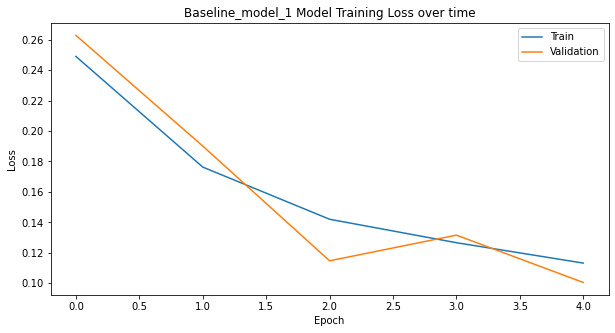

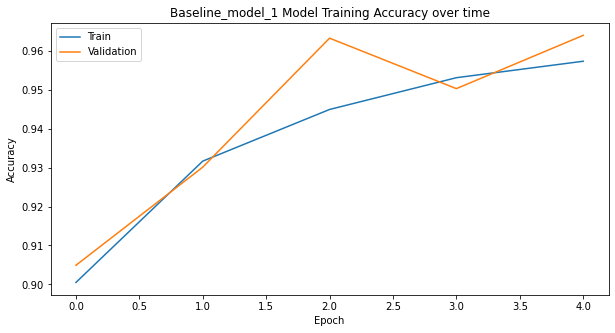

time: 708 ms


In [ ]:
hist_df = pd.DataFrame(training_history.history)
training_history_text = str(hist_df)
print(hist_df)
save_df(hist_df, training_history_file)

plot_training_loss(training_history, training_accuracy_file, training_loss_title)
plot_training_accuracy(training_history, training_loss_file, training_accuracy_title)

## Model evaluation

### Calculate accurary F1 score


In [ ]:
reload(utils)

<module 'utils' from '/home/mdabdullahal.alamin/alamin/Utility/utils.py'>

In [ ]:
# model_path = "/home/mdabdullahal.alamin/alamin/face_mask/model_output/real/batch_jobs/Baseline_model_1/Baseline_model_1.h5"
# test_dir = "/home/mdabdullahal.alamin/alamin/face_mask/dataset/RMFD/organized/test/"
# acc, _ = get_evaluation(model_path, test_dir)
# print(acc)

Going to load best performing model from: /home/mdabdullahal.alamin/alamin/face_mask/model_output/real/batch_jobs/Baseline_model_1/Baseline_model_1.h5
Found 1285 images belonging to 2 classes.
11/11 [==============================] - 4s 285ms/step - loss: 0.0491 - accuracy: 0.9805
98.05447459220886


In [ ]:
file = "/home/mdabdullahal.alamin/alamin/face_mask/model_output/real/batch_jobs/Baseline_model_1/Baseline_model_1.h5"
print(file.split("/"))
print(file.split("/")[-2])

['', 'home', 'mdabdullahal.alamin', 'alamin', 'face_mask', 'model_output', 'real', 'batch_jobs', 'Baseline_model_1', 'Baseline_model_1.h5']
Baseline_model_1


In [ ]:
from sklearn.metrics import precision_recall_fscore_support


def get_evaluation_result(pred_file):
    df = pd.read_csv(pred_file)
    y_true = df['true_label'].tolist()
    y_pred = df['predicted_label'].tolist()
    acc = sum(1 for x,y in zip(y_true, y_pred) if x == y) / float(len(y_true)) * 100
    # print(acc)
    P, R, F1, _ = precision_recall_fscore_support(y_true, y_pred, average='micro') 
    P *= 100
    R *= 100
    F1 *= 100
    print("*" * 20)
    print(pred_file)
    print("Model: %s \nAccurary: %.2f, Precison: %.2f, Recall: %.2f, F1: %.2f\n\n" % (str(pred_file).split("/")[-2], acc, P, R, F1))
    return (P, R, F1)

# dir = "/home/mdabdullahal.alamin/alamin/face_mask/model_output/real/batch_jobs/"
dir = "/home/mdabdullahal.alamin/alamin/face_mask/model_output/simulated/batch_jobs/"

files = utils.get_list_of_files_from_directory(dir=dir, file_patterns=["all_test_prediction.csv"])
for file in files:
    get_evaluation_result(file)
    # break

**/*all_test_prediction.csv
Total 8 files found in directory /home/mdabdullahal.alamin/alamin/face_mask/model_output/simulated/batch_jobs/
********************
/home/mdabdullahal.alamin/alamin/face_mask/model_output/simulated/batch_jobs/VGG19_transfer_learning/all_test_prediction.csv
Model: VGG19_transfer_learning 
Accurary: 99.69, Precison: 99.69, Recall: 99.69, F1: 99.69


********************
/home/mdabdullahal.alamin/alamin/face_mask/model_output/simulated/batch_jobs/Baseline_model_1/all_test_prediction.csv
Model: Baseline_model_1 
Accurary: 99.84, Precison: 99.84, Recall: 99.84, F1: 99.84


********************
/home/mdabdullahal.alamin/alamin/face_mask/model_output/simulated/batch_jobs/Resnet50/all_test_prediction.csv
Model: Resnet50 
Accurary: 99.61, Precison: 99.61, Recall: 99.61, F1: 99.61


********************
/home/mdabdullahal.alamin/alamin/face_mask/model_output/simulated/batch_jobs/VGG19/all_test_prediction.csv
Model: VGG19 
Accurary: 99.84, Precison: 99.84, Recall: 99.8

In [ ]:
# model_checkpoint_path = "/home/mdabdullahal.alamin/alamin/face_mask/model_output/RFMD_colab/Baseline_CNN/Baseline_CNN.h5"
# best_model = tf.keras.models.load_model(model_checkpoint_path)

time: 13.8 s


## Error Analysis

Going to load best performing model from: /home/mdabdullahal.alamin/alamin/face_mask/model_output/real/colab/Baseline_model_1/Baseline_model_1.h5
11/11 [==============================] - 5s 391ms/step - loss: 0.0601 - accuracy: 0.9751
Loss: 0.060 Accuracy: 97.510%
32
Model Test dataset:
Accuracy: 97.510%
Loss: 0.060
Total training time 468 seconds 0.1 Hours

Training epoch stats:        loss  accuracy  val_loss  val_accuracy      lr
0  0.249025  0.900492  0.262899      0.904899  0.0001
1  0.176311  0.931662  0.190135      0.930115  0.0001
2  0.142017  0.944936  0.114700      0.963256  0.0001
3  0.126598  0.953097  0.131576      0.950288  0.0001
4  0.113202  0.957325  0.100471      0.963977  0.0001

Incorrectly Predicted Samples:
mask/1078.jpg
mask/1120.jpg
mask/1134.jpg
mask/1178.jpg
mask/1245.jpg
mask/1252.jpg
mask/31.jpg
mask/340.jpg
mask/683.jpg
mask/8.jpg
mask/855.jpg
mask/898.jpg
without_mask/1216.jpg
without_mask/1240.jpg
without_mask/159.jpg
without_mask/175.jpg
without_mask/194

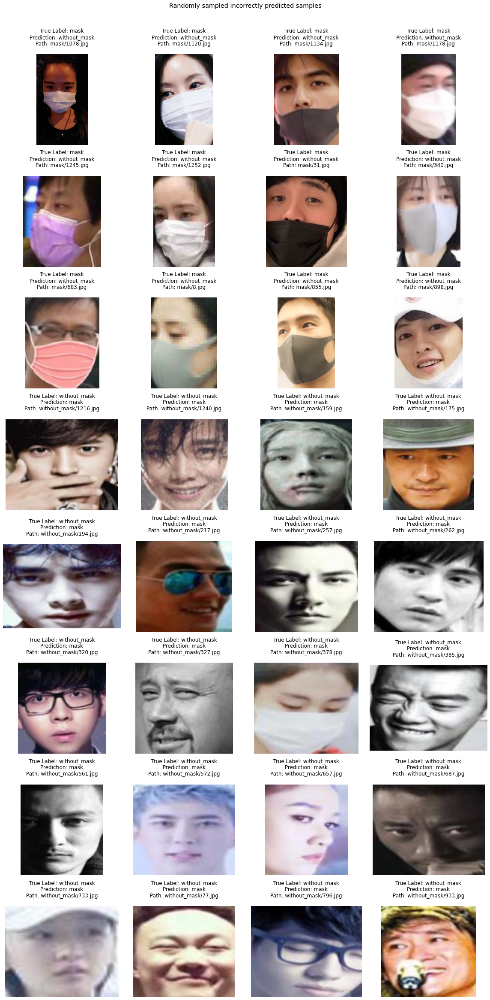

time: 18.5 s


In [ ]:
print("Going to load best performing model from: %s" % model_checkpoint_path)
best_model = tf.keras.models.load_model(model_checkpoint_path)
loss, accuracy = best_model.evaluate(test_generator)
print("Loss: %.3f Accuracy: %.3f%%" % (loss, accuracy * 100))

y_pred_org = best_model.predict(test_generator)
y_true_labels, y_pred_labels, test_image_files = get_true_and_pred_labels(y_pred_org)
incorrectly_predicted_samples = get_wrongly_predicted_sample_indexes(y_true_labels, y_pred_labels, test_image_files)
save_to_csv(y_true_labels, y_pred_labels, test_image_files, output_file=all_test_prediction_file)
visualize_incorrectly_predicted_samples(incorrectly_predicted_samples, base_dir=test_dir)

final_summary_text = "Model Test dataset:\nAccuracy: %.3f%%\nLoss: %.3f\n" % ( accuracy * 100, loss)
final_summary_text += "Total training time %d seconds %.1f Hours\n\n" % (total_training_time, total_training_time/3600)
final_summary_text += "Training epoch stats: %s\n\n" % training_history_text
final_summary_text += "Incorrectly Predicted Samples:\n%s\n" % '\n'.join([sam.path for sam in incorrectly_predicted_samples])
print(final_summary_text)
summary_output(final_summary_text, test_summary_file)

In [ ]:
# final_summary_text = "Model Test dataset:\nAccuracy: %.3f%%\nLoss: %.3f\n" % ( accuracy * 100, loss)
# final_summary_text += "Total training time %d seconds %.1f Hours\n\n" % (total_training_time, total_training_time/3600)
# final_summary_text += "Training epoch stats: %s\n\n" % training_history_text
# final_summary_text += "Incorrectly Predicted Samples:\n%s\n" % '\n'.join([sam.path for sam in incorrectly_predicted_samples])
# print(final_summary_text)
# summary_output(final_summary_text, test_summary_file)

In [ ]:
MODEL_NAMES = ["Baseline_model_1", "Baseline_model_2", "VGG19", "VGG19_transfer_learning", "Resnet50", "Resnet50"]

# Domain Adaptation

In [ ]:
def get_train_validation_test_dirs(root_dir):
    train_dir = os.path.join(root_dir, "train/")
    validation_dir = os.path.join(root_dir, "validation/")
    test_dir = os.path.join(root_dir, "test/")
    return train_dir, validation_dir, test_dir

def get_evaluation(model_checkpoint_path, test_dir):
    print("Going to load best performing model from: %s" % model_checkpoint_path)
    best_model = tf.keras.models.load_model(model_checkpoint_path)
    test_generator = get_data_generator_from_directory(test_dir, is_test_data=True)
    loss, accuracy = best_model.evaluate(test_generator)
    # print("Loss: %.3f Accuracy: %.3f%%" % (loss, accuracy * 100))
    return accuracy * 100, best_model

In [ ]:
source_domain = "Simulated Dataset"
target_domain = "Real Dataset"


BASE_DIR = "/home/mdabdullahal.alamin/alamin/face_mask"
model_output_dir = os.path.join(BASE_DIR, "model_output")
DA_output_dir = os.path.join(model_output_dir, "domain_adaptation")
DA_retrained_model_path = os.path.join(DA_output_dir, "DA_retrained.h5")
DA_retrained_DAN_model_path = os.path.join(DA_output_dir, "DA_DAN_retrained.h5")
incorrectly_predicted_samples_file = os.path.join(DA_output_dir, "DA_DAN_retrained_incorrect.png")

source_domain_dir = "/home/mdabdullahal.alamin/alamin/face_mask/dataset/masknet/organized/"
target_domain_dir = "/home/mdabdullahal.alamin/alamin/face_mask/dataset/RMFD/organized/"

# SD_best_model_path = "/home/mdabdullahal.alamin/alamin/face_mask/model_output/simulated/batch_jobs/Resnet50_transfer_learning/Resnet50_transfer_learning.h5"
SD_best_model_path = "/home/mdabdullahal.alamin/alamin/face_mask/model_output/simulated/batch_jobs/VGG19/VGG19.h5"
TD_best_model_path = "/home/mdabdullahal.alamin/alamin/face_mask/model_output/real/batch_jobs/Resnet50_transfer_learning/Resnet50_transfer_learning.h5"

source_train_dir, source_validation_dir, source_test_dir = get_train_validation_test_dirs(source_domain_dir)
target_train_dir, target_validation_dir, target_test_dir = get_train_validation_test_dirs(target_domain_dir)

In [ ]:
TD_best_acc, _ = get_evaluation(TD_best_model_path, target_test_dir)
DA_TD_acc, SD_best_model  = get_evaluation(SD_best_model_path, target_test_dir)

print("Target Domain is: %s.\n Best performing model in target Domain is: %s\n Target Domain best result: %.2f" % (target_domain, TD_best_model_path, TD_best_acc))
print("Target Domain performance: %.2f without domain adaptation from source domain." % (DA_TD_acc))


Going to load best performing model from: /home/mdabdullahal.alamin/alamin/face_mask/model_output/real/batch_jobs/Resnet50_transfer_learning/Resnet50_transfer_learning.h5
Found 1285 images belonging to 2 classes.
11/11 [==============================] - 6s 334ms/step - loss: 0.0159 - accuracy: 0.9946
Going to load best performing model from: /home/mdabdullahal.alamin/alamin/face_mask/model_output/simulated/batch_jobs/VGG19/VGG19.h5
Found 1285 images belonging to 2 classes.
11/11 [==============================] - 18s 963ms/step - loss: 2.8959 - accuracy: 0.5292
Target Domain is: Real Dataset.
 Best performing model in target Domain is: /home/mdabdullahal.alamin/alamin/face_mask/model_output/real/batch_jobs/Resnet50_transfer_learning/Resnet50_transfer_learning.h5
 Target Domain best result: 99.46
Target Domain performance: 52.92 without domain adaptation from source domain.


### Simple Re-train on target dataset

In [ ]:
# remove_and_create_directory(DA_output_dir)

DA_model = SD_best_model

early_stop, monitor_it, lr_schedule, threshold_callback = get_callbacks(DA_retrained_model_path)
TD_train_generator = get_data_generator_from_directory(target_train_dir)
TD_validation_generator = get_data_generator_from_directory(target_validation_dir)
TD_test_generator = get_data_generator_from_directory(target_test_dir, is_test_data=True)



Found 10170 images belonging to 2 classes.
Found 1388 images belonging to 2 classes.
Found 1285 images belonging to 2 classes.


In [ ]:
from datetime import timedelta
start_time = time.time()

training_history = DA_model.fit(TD_train_generator, epochs=100, verbose = 1, \
                       callbacks = [early_stop, monitor_it, lr_schedule, threshold_callback], \
                       validation_data = (TD_validation_generator))

end_time = time.time()
total_training_time = int(end_time - start_time)
print("Total training time: %d" % total_training_time)

Epoch 1/100
80/80 [==============================] - 165s 2s/step - loss: 0.7441 - accuracy: 0.5313 - val_loss: 0.6653 - val_accuracy: 0.4827
=========================> Epoch is finished and validation accuracy is: 0.48
Epoch 2/100
80/80 [==============================] - 131s 2s/step - loss: 0.4665 - accuracy: 0.7482 - val_loss: 0.1881 - val_accuracy: 0.9373
=========================> Epoch is finished and validation accuracy is: 0.94
Epoch 3/100
80/80 [==============================] - 131s 2s/step - loss: 0.1705 - accuracy: 0.9353 - val_loss: 0.1381 - val_accuracy: 0.9496
=========================> Epoch is finished and validation accuracy is: 0.95
Epoch 4/100
80/80 [==============================] - 130s 2s/step - loss: 0.1240 - accuracy: 0.9539 - val_loss: 0.1311 - val_accuracy: 0.9539
=========================> Epoch is finished and validation accuracy is: 0.95
Epoch 5/100
80/80 [==============================] - 131s 2s/step - loss: 0.1009 - accuracy: 0.9629 - val_loss: 0.1571 -

In [ ]:
accurary, DA_best_model = get_evaluation(DA_retrained_model_path, target_test_dir)
print("\n\n ==> Target Domain performance: %.2f after simply retraining on the target domain. Similar to Transfer learning.\n" % (accurary))
accurary, _ = get_evaluation(DA_retrained_model_path, source_test_dir)
print("\n\n ==> Source Domain accurary: %.2f after retraining on target domain" % (accurary))

Going to load best performing model from: /home/mdabdullahal.alamin/alamin/face_mask/model_output/domain_adaptation/DA_retrained.h5
Found 1285 images belonging to 2 classes.
11/11 [==============================] - 5s 369ms/step - loss: 0.0387 - accuracy: 0.9891


 ==> Target Domain performance: 98.91 after simply retraining on the target domain. Similar to Transfer learning.

Going to load best performing model from: /home/mdabdullahal.alamin/alamin/face_mask/model_output/domain_adaptation/DA_retrained.h5
Found 1285 images belonging to 2 classes.
11/11 [==============================] - 26s 2s/step - loss: 11.1774 - accuracy: 0.5144


 ==> Source Domain accurary: 51.44 after retraining on target domain


In [ ]:
accurary, _ = get_evaluation(DA_retrained_model_path, source_test_dir)
print("\n\n ==> Source Domain accurary: %.2f after retraining on target domain" % (accurary))

Going to load best performing model from: /home/mdabdullahal.alamin/alamin/face_mask/model_output/domain_adaptation/DA_retrained.h5
Found 1285 images belonging to 2 classes.
11/11 [==============================] - 21s 1s/step - loss: 11.1774 - accuracy: 0.5144


 ==> Source Domain accurary: 51.44 after retraining on target domain


In [ ]:
accurary, TD_best_model = get_evaluation(SD_best_model_path, source_test_dir)
print("Source Domain accurary: %.2f" % (accurary))

Going to load best performing model from: /home/mdabdullahal.alamin/alamin/face_mask/model_output/simulated/batch_jobs/VGG19/VGG19.h5
Found 1285 images belonging to 2 classes.
11/11 [==============================] - 21s 1s/step - loss: 0.0117 - accuracy: 0.9984
Source Domain accurary: 99.84


14


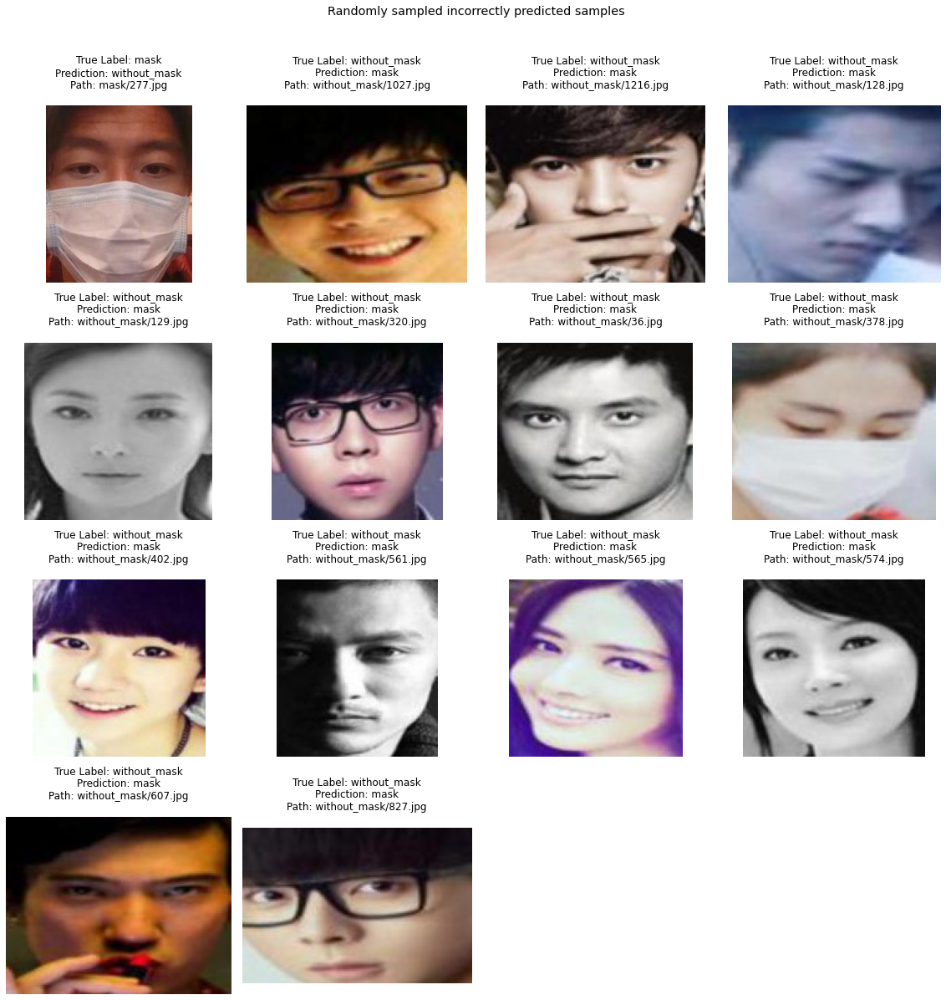

In [ ]:
y_pred_org = DA_best_model.predict(TD_test_generator)
y_true_labels, y_pred_labels, test_image_files = get_true_and_pred_labels(y_pred_org)
incorrectly_predicted_samples = get_wrongly_predicted_sample_indexes(y_true_labels, y_pred_labels, test_image_files)
# save_to_csv(y_true_labels, y_pred_labels, test_image_files, output_file=all_test_prediction_file)
visualize_incorrectly_predicted_samples(incorrectly_predicted_samples, base_dir=test_dir, output_file=incorrectly_predicted_samples_file)

# SMFD

In [ ]:
BASE_DIR = "/home/mdabdullahal.alamin/alamin/face_mask/"
smfd_path = "/home/mdabdullahal.alamin/alamin/face_mask/dataset/SMFD/observations-master/experiements/data/"
smfd_mask = os.path.join(smfd_path, "with_mask")
smfd_without_mask = os.path.join(smfd_path, "without_mask")


In [ ]:
with_mask_images = list(pathlib.Path(smfd_mask).glob('**/*.jpg'))
without_mask_images = list(pathlib.Path(smfd_without_mask).glob('**/*.jpg'))
print(len(with_mask_images))
print(len(without_mask_images))

690
686


### Sample visualization


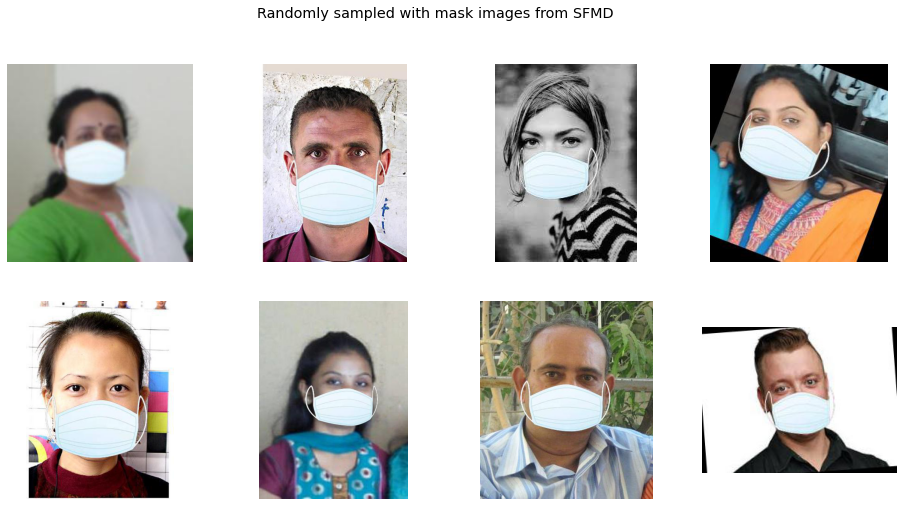

In [ ]:
nrows = 2
ncols = 4

fig = plt.gcf()
fig.set_size_inches(ncols*4, nrows*4)
fig.tight_layout()
fig.suptitle("Randomly sampled with mask images from SFMD", fontsize="x-large")

for i in range(8):
    img_ind = random.randint(0, len(with_mask_images))
    img = mpimg.imread(with_mask_images[img_ind])
    sp = plt.subplot(nrows, ncols, i + 1)
    sp.axis('Off')
    plt.imshow(img)

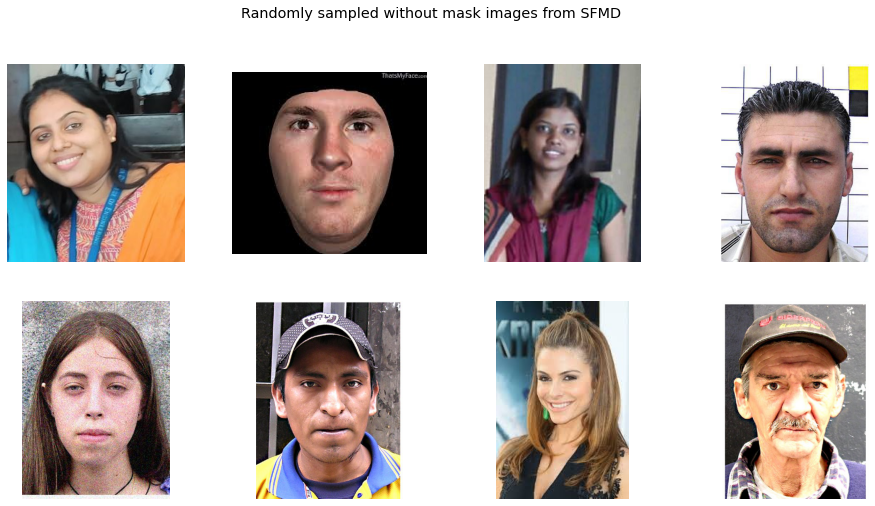

In [ ]:


nrows = 2
ncols = 4

fig = plt.gcf()
fig.set_size_inches(ncols*4, nrows*4)
fig.tight_layout()
fig.suptitle("Randomly sampled without mask images from SFMD", fontsize="x-large")

for i in range(8):
    img_ind = random.randint(0, len(without_mask_images))
    img = mpimg.imread(without_mask_images[img_ind])
    sp = plt.subplot(nrows, ncols, i + 1)
    sp.axis('Off')
    plt.imshow(img)

# MaskNet


In [ ]:
BASE_DIR = "/home/mdabdullahal.alamin/alamin/face_mask/"
masknet_path = "/home/mdabdullahal.alamin/alamin/face_mask/dataset/masknet/"
masknet_correct_mask = os.path.join(masknet_path, "cmdf")
masknet_incorrect_mask = os.path.join(masknet_path, "imdf")

print(masknet_correct_mask)

/home/mdabdullahal.alamin/alamin/face_mask/dataset/masknet/cmdf
time: 696 µs


In [ ]:
correct_mask_images = list(pathlib.Path(masknet_correct_mask).glob('**/*.jpg'))
incorrect_mask_images = list(pathlib.Path(masknet_incorrect_mask).glob('**/*.jpg'))
print(len(correct_mask_images))
print(len(incorrect_mask_images))

33686
33553
time: 4.65 s


## Visualization

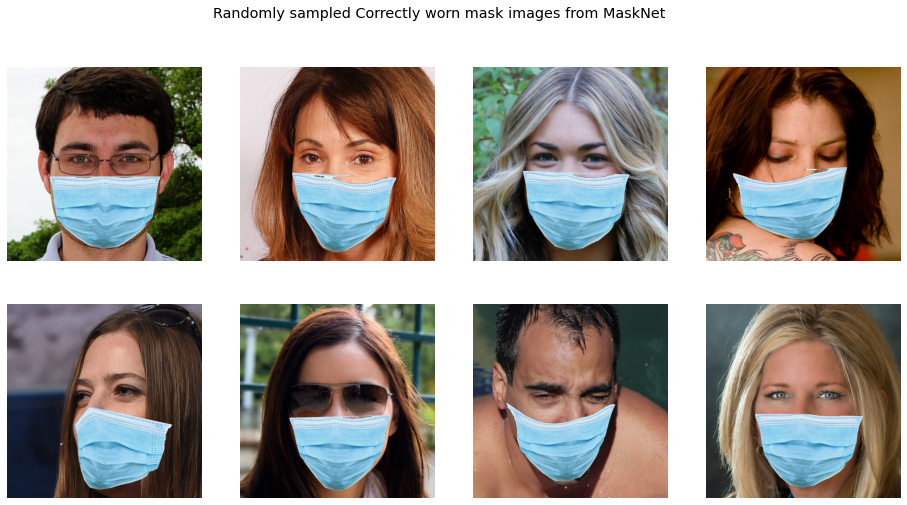

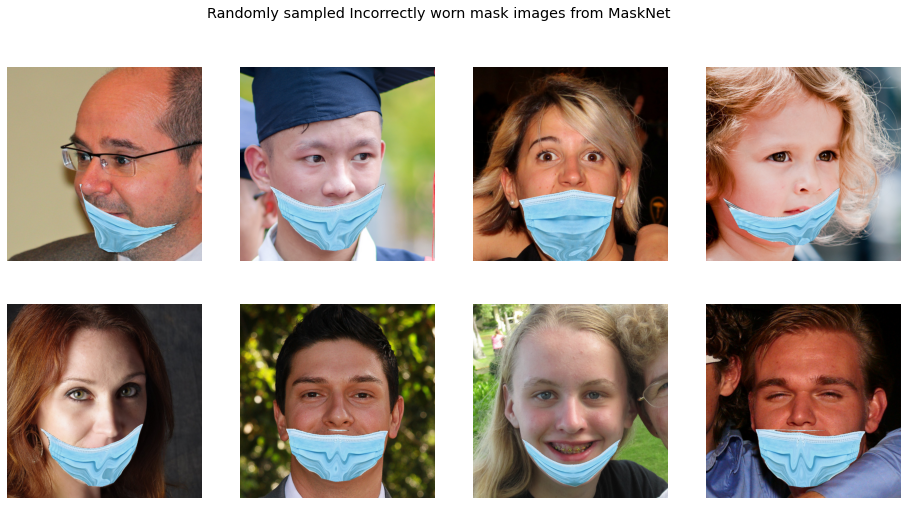

In [ ]:
def visualize_images(imges, nrows=2, ncols=4, title = "Images"):
    fig = plt.gcf()
    fig.set_size_inches(ncols*4, nrows*4)
    fig.tight_layout()
    fig.suptitle(title , fontsize="x-large")
    for i in range(len(imges)):
        # img_ind = random.randint(0, len(without_mask_images))
        # img = mpimg.imread(without_mask_images[img_ind])
        img = mpimg.imread(imges[i])
        sp = plt.subplot(nrows, ncols, i + 1)
        sp.axis('Off')
        plt.imshow(img)
    plt.show()

random.seed(33)
correct_mask = random.sample(correct_mask_images, 8)
visualize_images(correct_mask, title="Randomly sampled Correctly worn mask images from MaskedFaceNet")

random.seed(33)
incorrect_mask = random.sample(incorrect_mask_images, 8)
visualize_images(incorrect_mask, title="Randomly sampled Incorrectly worn mask images from MaskedFaceNet")

## Process data

In [ ]:
Samples_per_class = 10000
random.seed(100)


print(len(correct_mask_images))
print(len(incorrect_mask_images))

33686
33553
time: 1.2 ms


In [ ]:
random.seed(100)
correct_mask_selected_images = random.sample(correct_mask_images, Samples_per_class)
random.seed(100)
incorrect_mask_selected_images = random.sample(incorrect_mask_images, Samples_per_class)

# print(correct_mask_selected_images)
# print(incorrect_mask_selected_images)

X_all = correct_mask_selected_images + incorrect_mask_selected_images
Y_all = ["correct"] * len(correct_mask_selected_images) + ["incorrect"] * len(incorrect_mask_selected_images)
assert len(X_all) == len(Y_all)

print("Total samples: %d" % len(X_all))

Total samples: 20000
time: 18.6 ms


In [ ]:
X_train, X_validation, X_test, y_train, y_validation, y_test = get_train_validation_test_split(X_all, Y_all)

Initial Train size: 18000 Test size: 2000
Train size: 15840 Validation size: 2160 Test size: 2000
time: 27.6 ms


In [ ]:
import shutil

# uses global variable classes
def copy_to_standard_folder_structure(target_dir, X, y, classes = CLASS_NAMES):
    print("Tagget dir: %s and len: %d" % (target_dir, len(X)))
    remove_directory(target_dir)
    create_directory(target_dir)
    for class_type in CLASS_NAMES:
        dir_name = os.path.join(target_dir, class_type)
        create_directory(dir_name)
    for i in range(len(X)):
        org_img_path = str(X[i])
        org_img_path_ext = org_img_path[-4:]
        new_img_name = str(i) + org_img_path_ext
        new_img_path = os.path.join(target_dir, y[i], new_img_name)
        if(i % 300 == 0):
            print(new_img_path)
        shutil.copyfile(org_img_path, new_img_path)
        # break
    print("\n\n\n ============ Copy Over ========== \n\n")

CLASS_NAMES = ["correct", "incorrect"]
dataset_dir = os.path.join(BASE_DIR, "dataset", "masknet", "organized")
train_dir = os.path.join(dataset_dir, "train/")
validation_dir = os.path.join(dataset_dir, "validation/")
test_dir = os.path.join(dataset_dir, "test/")

print(dataset_dir, train_dir, validation_dir, test_dir)


copy_to_standard_folder_structure(validation_dir, X_validation, y_validation)
copy_to_standard_folder_structure(test_dir, X_test, y_test)
copy_to_standard_folder_structure(train_dir, X_train, y_train)

In [ ]:
def get_list_of_image_from_directory(dir):
    res = list(pathlib.Path(dir).glob('**/*.jpg'))
    print("Total %d images found in directory %s" % (len(res), dir))
    return res
print("Directory status")
get_list_of_image_from_directory(train_dir)
get_list_of_image_from_directory(validation_dir)
get_list_of_image_from_directory(test_dir)
print("over")

Directory status
Total 15840 images found in directory /home/mdabdullahal.alamin/alamin/face_mask/dataset/masknet/organized/train/
Total 2160 images found in directory /home/mdabdullahal.alamin/alamin/face_mask/dataset/masknet/organized/validation/
Total 2000 images found in directory /home/mdabdullahal.alamin/alamin/face_mask/dataset/masknet/organized/test/
over
time: 562 ms
